In [5]:
%pip install tensorflow
%pip install tensorflow_hub
import tensorflow as tf
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
    raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)

cpu()
gpu()

print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 8.1 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.
Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images (batch x height x width x channel). Sum of ten runs.
CPU (s):


I0000 00:00:1747075462.767654   45425 gpu_device.cc:2019] Created device /device:GPU:0 with 3620 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3050 6GB Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


0.9076436030009063
GPU (s):
0.1372377999996388
GPU speedup over CPU: 6x


In [6]:
import tensorflow as tf
import tensorflow_hub as hub

tf.__version__, hub.__version__

('2.19.0', '0.16.1')

In [7]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [9]:
import pandas as pd
labels = pd.read_csv("../raw/labels.csv")

In [10]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [11]:
labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [12]:
labels.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [13]:
labels['breed'].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

<Axes: xlabel='breed'>

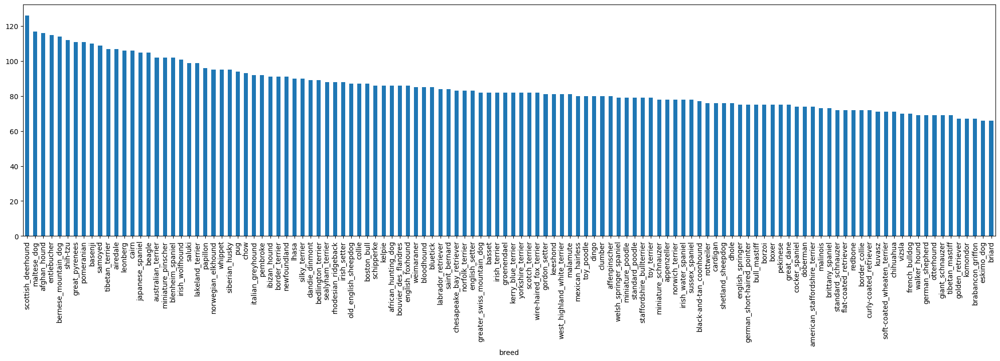

In [14]:
labels['breed'].value_counts().plot(figsize=(25,6), kind='bar')

In [16]:
labels['breed'].value_counts().mean(),labels['breed'].value_counts().median()

(np.float64(85.18333333333334), np.float64(82.0))

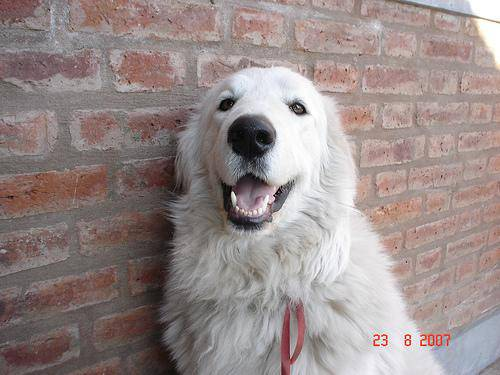

In [18]:
from IPython.display import Image

Image('../raw/train/0a0c223352985ec154fd604d7ddceabd.jpg')

In [19]:
import os
os.listdir('../raw/train')[:10]

['955677ee4ce177492ce886426271f831.jpg',
 '6ca3c20b7b00b635b61d354267fac43f.jpg',
 'a768d7fc2b42dc15018ba9641b401db5.jpg',
 'acd32654070ec86fa6d5fd2145327563.jpg',
 '734f1c50dace63c4b6786b765b8464c1.jpg',
 '8494afd34e3a2e81bec37e4dfdc67f8d.jpg',
 '71c0db4c32de5972f071875db3b5c6f4.jpg',
 '01b36cb1b80ab8c3a7d2b7128ad21bdc.jpg',
 'be9a79b75ab68064bbcecbd4eb4ef959.jpg',
 '4449821c82f34273b557859c9b42a47f.jpg']

In [25]:
files=['../raw/train/'+fname+'.jpg' for fname in labels['id']]
files[:10]

['../raw/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '../raw/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '../raw/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '../raw/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '../raw/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '../raw/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '../raw/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '../raw/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '../raw/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '../raw/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [26]:
if(len(files) ==len(os.listdir("../raw/train"))):
    print("All files are present")
else:
    print("Some files are missing")

All files are present


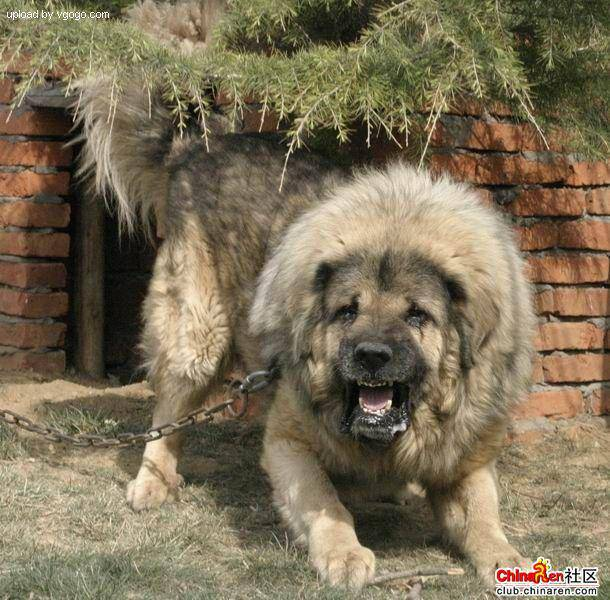

In [27]:
Image(files[9000])

In [28]:
labels.iloc[9000]

id       e20e32bf114141e20a1af854ca4d0ecc
breed                     tibetan_mastiff
Name: 9000, dtype: object

In [29]:
import numpy as np
breeds = labels['breed'].to_numpy()
breeds

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [31]:
if len(breeds) == len(files):
    print("All labels are present")
else:
    print("Some labels are missing")

All labels are present


In [32]:
unique_breeds = np.unique(breeds)
len(unique_breeds)

120

In [33]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [34]:
breeds[1],breeds[1] == unique_breeds

('dingo',
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]))

In [35]:
boolean_labels=[breed==unique_breeds for breed in breeds]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [36]:
len(boolean_labels)

10222

In [40]:
print(breeds[2])
print(np.where(breeds[2] == unique_breeds))
print(boolean_labels[2].argmax())
boolean_labels[2].astype(int)

pekinese
(array([85]),)
85


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [41]:
len(files)

10222

In [42]:
X = files
y = boolean_labels

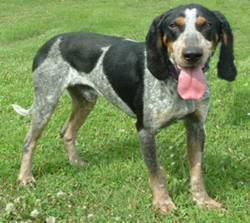

In [43]:
Image(files[13])

In [44]:
from matplotlib.pyplot import imread
image = imread(files[13])
image

array([[[122, 159,  81],
        [132, 169,  91],
        [138, 175,  97],
        ...,
        [144, 170, 109],
        [124, 153,  89],
        [124, 153,  89]],

       [[124, 161,  83],
        [125, 162,  84],
        [121, 158,  80],
        ...,
        [150, 176, 113],
        [144, 173, 109],
        [144, 173, 109]],

       [[130, 167,  89],
        [126, 163,  85],
        [119, 156,  78],
        ...,
        [151, 177, 112],
        [141, 170, 104],
        [141, 170, 104]],

       ...,

       [[129, 166,  96],
        [143, 180, 110],
        [127, 163,  91],
        ...,
        [158, 194, 104],
        [133, 169,  81],
        [122, 158,  70]],

       [[136, 176, 105],
        [128, 168,  97],
        [100, 138,  65],
        ...,
        [143, 182,  91],
        [134, 173,  84],
        [121, 161,  72]],

       [[175, 217, 145],
        [165, 207, 135],
        [143, 180, 110],
        ...,
        [127, 166,  75],
        [134, 174,  85],
        [119, 162,  72]]

In [45]:
image.shape

(223, 250, 3)

In [46]:
image[:2]

array([[[122, 159,  81],
        [132, 169,  91],
        [138, 175,  97],
        ...,
        [144, 170, 109],
        [124, 153,  89],
        [124, 153,  89]],

       [[124, 161,  83],
        [125, 162,  84],
        [121, 158,  80],
        ...,
        [150, 176, 113],
        [144, 173, 109],
        [144, 173, 109]]], dtype=uint8)

In [47]:
tf.constant(image)

<tf.Tensor: shape=(223, 250, 3), dtype=uint8, numpy=
array([[[122, 159,  81],
        [132, 169,  91],
        [138, 175,  97],
        ...,
        [144, 170, 109],
        [124, 153,  89],
        [124, 153,  89]],

       [[124, 161,  83],
        [125, 162,  84],
        [121, 158,  80],
        ...,
        [150, 176, 113],
        [144, 173, 109],
        [144, 173, 109]],

       [[130, 167,  89],
        [126, 163,  85],
        [119, 156,  78],
        ...,
        [151, 177, 112],
        [141, 170, 104],
        [141, 170, 104]],

       ...,

       [[129, 166,  96],
        [143, 180, 110],
        [127, 163,  91],
        ...,
        [158, 194, 104],
        [133, 169,  81],
        [122, 158,  70]],

       [[136, 176, 105],
        [128, 168,  97],
        [100, 138,  65],
        ...,
        [143, 182,  91],
        [134, 173,  84],
        [121, 161,  72]],

       [[175, 217, 145],
        [165, 207, 135],
        [143, 180, 110],
        ...,
        [127, 166,  7

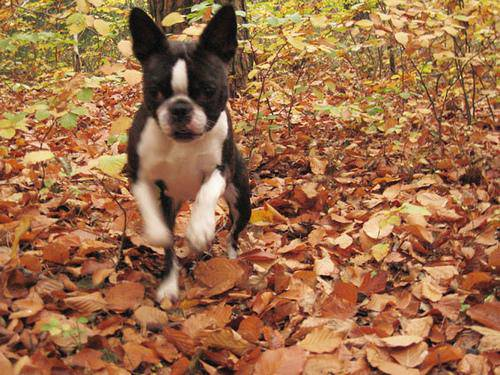

In [48]:
Image(files[0])

In [49]:
NUM_IMAGES = 1000

In [50]:
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],train_size=0.8)

len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [51]:
X_train[:10], y_train[:10]

(['../raw/train/0709abee3095717f43db409dd7ce769b.jpg',
  '../raw/train/1609abf6c6ac2e8df0af837cbe9cee74.jpg',
  '../raw/train/0c8fe33bd89646b678f6b2891df8a1c6.jpg',
  '../raw/train/0450c3899b7ca7cac31406a52c7bc74e.jpg',
  '../raw/train/055429c6fb404af27ac52a08216e6cda.jpg',
  '../raw/train/0a7f8d31c960071d0d4cfba36c0159c7.jpg',
  '../raw/train/0120343862761d052d6a7ade81625c94.jpg',
  '../raw/train/0f6d2d6c124fb61ba7c59ef8dbd42c99.jpg',
  '../raw/train/0a896d2b3af617df543787b571e439d8.jpg',
  '../raw/train/08782eb5ac167ca5f8feaccb519e9b4e.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, F

In [52]:
IMG_SIZE = 224

def process_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])

    return image

In [53]:
image_path=files[0]
image = tf.io.read_file(image_path)
image

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [54]:
tf.image.decode_jpeg(tf.io.read_file(files[3]), channels=3)

<tf.Tensor: shape=(344, 400, 3), dtype=uint8, numpy=
array([[[ 70,  66,  63],
        [ 94,  93,  89],
        [ 83,  82,  78],
        ...,
        [ 65,  69,  54],
        [ 56,  62,  48],
        [ 48,  56,  43]],

       [[ 57,  53,  50],
        [ 92,  91,  87],
        [ 91,  92,  87],
        ...,
        [ 46,  48,  34],
        [ 39,  45,  31],
        [ 41,  49,  36]],

       [[ 60,  59,  55],
        [ 96,  95,  91],
        [ 88,  89,  84],
        ...,
        [ 42,  43,  29],
        [ 45,  49,  35],
        [ 58,  64,  50]],

       ...,

       [[104,  88,  75],
        [133, 120, 104],
        [147, 134, 118],
        ...,
        [ 99,  80,  66],
        [112,  87,  82],
        [114,  89,  85]],

       [[121, 105,  92],
        [ 78,  65,  49],
        [133, 120, 104],
        ...,
        [147, 128, 114],
        [ 92,  67,  62],
        [119,  94,  90]],

       [[113,  97,  84],
        [ 98,  85,  69],
        [117, 104,  88],
        ...,
        [109,  90,  7

In [55]:
tf.io.read_file(files[0])

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [56]:
tf.image.convert_image_dtype(tf.image.decode_jpeg(tf.io.read_file(files[3]), channels=3), tf.float32)

<tf.Tensor: shape=(344, 400, 3), dtype=float32, numpy=
array([[[0.27450982, 0.25882354, 0.24705884],
        [0.36862746, 0.3647059 , 0.34901962],
        [0.3254902 , 0.32156864, 0.30588236],
        ...,
        [0.25490198, 0.27058825, 0.21176472],
        [0.21960786, 0.24313727, 0.18823531],
        [0.18823531, 0.21960786, 0.16862746]],

       [[0.22352943, 0.20784315, 0.19607845],
        [0.36078432, 0.35686275, 0.34117648],
        [0.35686275, 0.36078432, 0.34117648],
        ...,
        [0.18039216, 0.18823531, 0.13333334],
        [0.15294118, 0.1764706 , 0.12156864],
        [0.16078432, 0.19215688, 0.14117648]],

       [[0.23529413, 0.23137257, 0.21568629],
        [0.37647063, 0.37254903, 0.35686275],
        [0.34509805, 0.34901962, 0.32941177],
        ...,
        [0.16470589, 0.16862746, 0.1137255 ],
        [0.1764706 , 0.19215688, 0.13725491],
        [0.227451  , 0.2509804 , 0.19607845]],

       ...,

       [[0.40784317, 0.34509805, 0.29411766],
        [0.52

In [57]:
def get_label(path, label):
    return process_image(path), label

In [58]:
(process_image(X[13]),tf.constant(y[13]))


(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.47678575, 0.62188375, 0.30815828],
         [0.51782215, 0.6629202 , 0.34919468],
         [0.5327031 , 0.67780113, 0.36407563],
         ...,
         [0.56141454, 0.6717262 , 0.42188376],
         [0.49532533, 0.6122896 , 0.36130923],
         [0.48235297, 0.6       , 0.34901962]],
 
        [[0.486211  , 0.63130903, 0.31758353],
         [0.4844512 , 0.6295492 , 0.31582373],
         [0.4681175 , 0.61321557, 0.29949003],
         ...,
         [0.58139545, 0.6950981 , 0.43859532],
         [0.56051975, 0.6774841 , 0.42514732],
         [0.5563638 , 0.67768013, 0.41569197]],
 
        [[0.5086412 , 0.6537392 , 0.34776926],
         [0.48860604, 0.6337041 , 0.32773417],
         [0.4582992 , 0.60339725, 0.29742733],
         ...,
         [0.5842827 , 0.6980082 , 0.43645748],
         [0.55202645, 0.6721934 , 0.40956438],
         [0.5452294 , 0.66679543, 0.40040523]],
 
        ...,
 
        [[0.5015175 , 0.6584678 

In [59]:
BATCH_SIZE = 32


def create_batch(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    if test_data:
        print("Creating test batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch
    elif valid_data:
        print("Creating validation batches...")
        # Receives tensors of path and label, and returns batches
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        # get_label preprocesses the image and returns (image,label) tuple
        data_batch = data.map(get_label).batch(BATCH_SIZE)
        return data_batch

    else:
        print("Creating train batches")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        data = data.shuffle(len(X))
        data_batch = data.map(get_label).batch(BATCH_SIZE)
        return data_batch

In [60]:
data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
list(data)

2025-05-12 19:03:43.613695: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


[(<tf.Tensor: shape=(), dtype=string, numpy=b'../raw/train/000bec180eb18c7604dcecc8fe0dba07.jpg'>,
  <tf.Tensor: shape=(120,), dtype=bool, numpy=
  array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fals

In [61]:
train_data = create_batch(X_train, y_train)
val_data = create_batch(X_val, y_val, valid_data=True)

Creating train batches
Creating validation batches...


In [62]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [65]:
import matplotlib.pyplot as plt

def show_images(images, labels):
    plt.figure(figsize=(20,20))

    for i in range(len(images)):
        ax = plt.subplot(5, 5, i+1)
        plt.imshow(images[i])
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis('off')

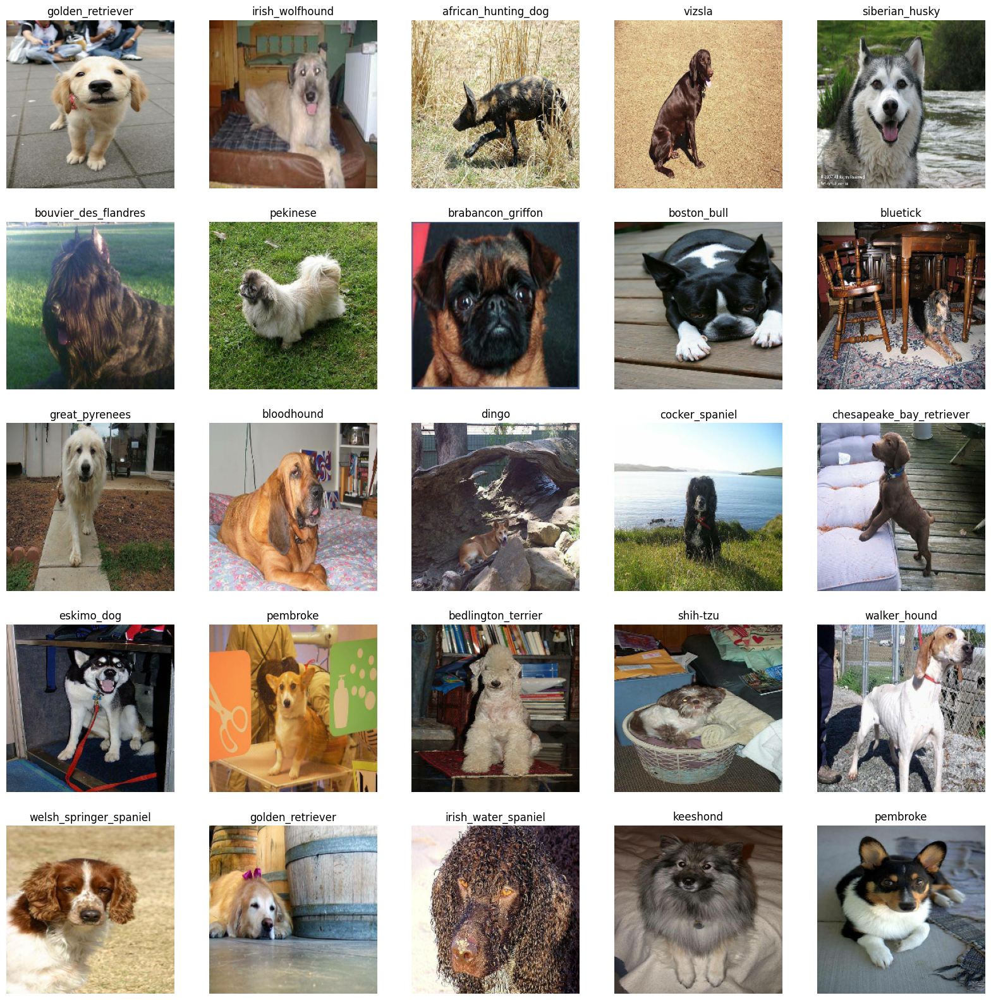

In [66]:
train_img, train_label = next(train_data.as_numpy_iterator())
show_images(train_img[:25], train_label[:25])

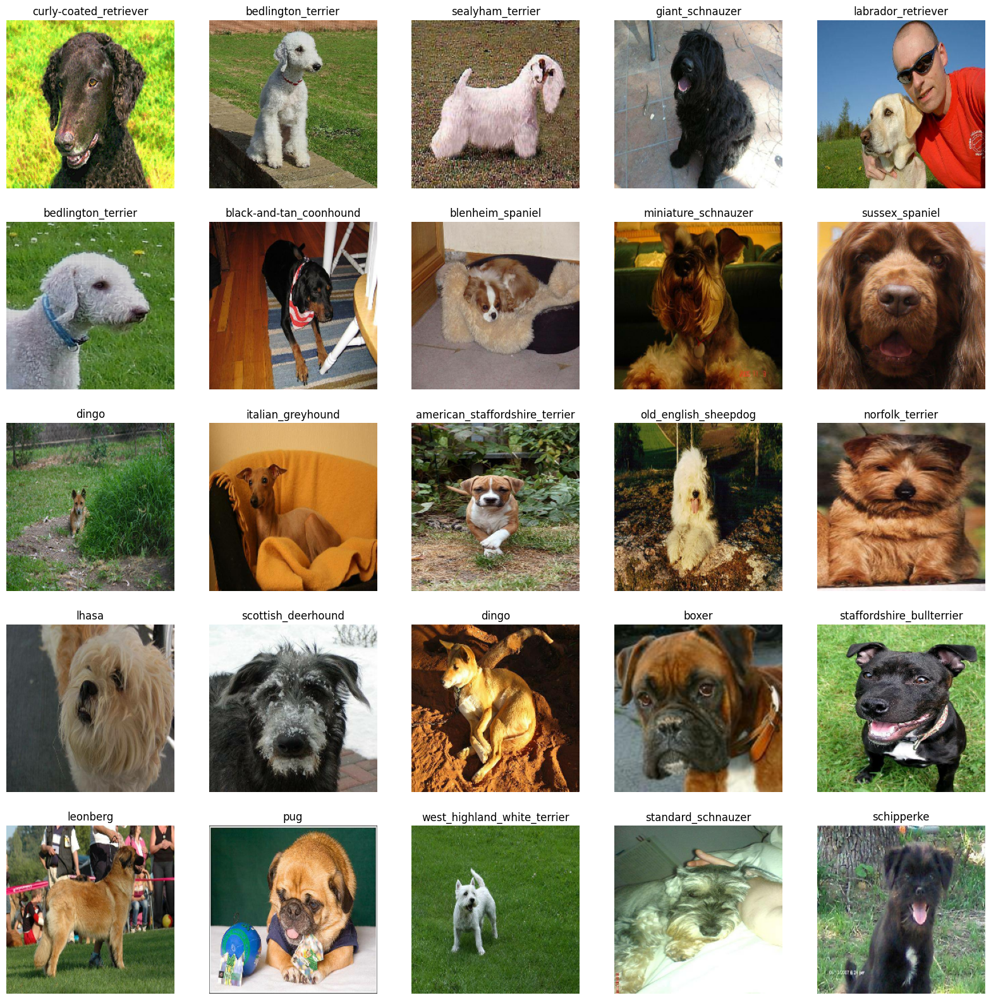

In [67]:
val_img, val_label = next(val_data.as_numpy_iterator())
show_images(val_img[:25], val_label[:25])

In [68]:
IMG_SIZE

224

In [69]:
INPUT_SHAPE = [0, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


In [80]:
def create_model(input_shape=INPUT_SHAPE[1:], output_shape=OUTPUT_SHAPE):
    print("Building model for dog breed classification")
    
    # Create base model - MobileNetV2 with proper configuration
    base_model = keras.applications.MobileNetV2(
        input_shape=input_shape,
        include_top=False,
        weights="imagenet"
    )
    
    # Freeze the base model initially
    base_model.trainable = False
    
    # Add a proper feature extraction architecture
    model = tf.keras.Sequential([
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),  # Convert features to vector
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(512, activation='relu'),  # Add more capacity
        tf.keras.layers.Dropout(0.3),  # Prevent overfitting
        tf.keras.layers.Dense(256, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(output_shape, activation="softmax")  # Output layer
    ])
    
    # Compile with better settings
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        metrics=["accuracy"]
    )
    
    return model

In [81]:
model = create_model()
model.summary()

Building model for dog breed classification


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 120)            │        30,840 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,081,144 (11.75 MB)

 Trainable params: 820,600 (3.13 MB)

 Non-trainable params: 2,260,544 (8.62 MB)

In [83]:
os.makedirs('../logs')

In [85]:
!ls ..

app.py	logs   notebooks	      raw
input	model  prepare_dataset.ipynb  requirements.txt


In [98]:
%load_ext tensorboard
import datetime

def tensorboard_callback():
    logdir = os.path.join('../logs', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [99]:
early_stop=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)


In [100]:
print("Yes" if tf.config.list_physical_devices("GPU") else "No")


Yes


In [101]:
NUM_EPOCHS=100
def train_model():
    model=create_model()
    tb=tensorboard_callback()
    
    model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tb,early_stop])
    
    return model

In [102]:
model=train_model()

Building model for dog breed classification
Epoch 1/100


I0000 00:00:1747077441.992442   45895 service.cc:152] XLA service 0x7fb6180239e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1747077441.992648   45895 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 6GB Laptop GPU, Compute Capability 8.6
2025-05-12 19:17:22.155254: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.


 1/25 ━━━━━━━━━━━━━━━━━━━━ 6:46 17s/step - accuracy: 0.0000e+00 - loss: 5.3999

I0000 00:00:1747077454.560328   45895 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


24/25 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.0393 - loss: 5.0743

2025-05-12 19:17:38.960485: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1221_0', 44 bytes spill stores, 44 bytes spill loads

2025-05-12 19:17:39.415569: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1221', 484 bytes spill stores, 484 bytes spill loads

2025-05-12 19:17:45.962662: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1221', 64 bytes spill stores, 64 bytes spill loads



25/25 ━━━━━━━━━━━━━━━━━━━━ 36s 810ms/step - accuracy: 0.0421 - loss: 5.0481 - val_accuracy: 0.1700 - val_loss: 4.2374
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.4461 - loss: 3.0395 - val_accuracy: 0.3850 - val_loss: 3.2770
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ -1s -26795us/step - accuracy: 0.7249 - loss: 1.8269 - val_accuracy: 0.5350 - val_loss: 2.6683
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.8562 - loss: 1.4980 - val_accuracy: 0.5400 - val_loss: 2.4540
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - accuracy: 0.9072 - loss: 1.3306 - val_accuracy: 0.5800 - val_loss: 2.3541
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.9471 - loss: 1.2303 - val_accuracy: 0.5800 - val_loss: 2.3018
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.9524 - loss: 1.2161 - val_accuracy: 0.5800 - val_loss: 2.2848
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.9568 - loss: 1.1683 - val_accuracy: 0.5650 

In [103]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 646ms/step


array([[0.000634  , 0.00217896, 0.00349127, ..., 0.00154383, 0.00420832,
        0.0015235 ],
       [0.00037312, 0.0029795 , 0.00683046, ..., 0.00734762, 0.00766862,
        0.00137236],
       [0.01091871, 0.00324403, 0.00480111, ..., 0.00466207, 0.00344485,
        0.00107507],
       ...,
       [0.00147755, 0.00409578, 0.01000013, ..., 0.01464201, 0.00918048,
        0.00126243],
       [0.00159127, 0.00573364, 0.00114709, ..., 0.00159877, 0.001171  ,
        0.00212482],
       [0.00881776, 0.00240401, 0.0069573 , ..., 0.0038479 , 0.00297409,
        0.00431479]], dtype=float32)

In [104]:
predictions.shape

(200, 120)

In [105]:
idx=0
print(predictions[idx])
print(f"Max value is: {np.max(predictions[idx])}")
print(f"index of max value is: {np.argmax(predictions[idx])}")
print(f"predicted breed is {unique_breeds[np.argmax(predictions[idx])]}")

[6.33998134e-04 2.17896467e-03 3.49127268e-03 3.01674684e-03
 3.73711274e-03 4.46094945e-03 1.39078533e-03 2.32281187e-03
 3.64022981e-03 2.37208602e-04 8.12782813e-03 1.01560922e-02
 3.32408189e-03 3.66821513e-03 1.14047434e-03 5.06699132e-03
 2.22605988e-02 1.26020436e-03 1.68084062e-03 1.02517067e-03
 3.77333350e-03 1.50834478e-03 2.90549104e-03 2.08982779e-03
 1.86735915e-03 4.03587800e-03 7.58188486e-04 8.58309621e-04
 7.67432014e-03 1.31953717e-03 4.41308320e-03 6.32255338e-03
 8.57221149e-03 1.40681444e-03 4.44486737e-01 1.50372495e-03
 2.49917712e-03 7.85226561e-03 1.97680593e-02 2.37555662e-03
 8.19170661e-03 6.29572710e-03 4.38817125e-03 2.71861139e-03
 1.03365155e-02 1.66360207e-03 1.15024869e-03 5.60303172e-03
 9.23527812e-04 7.57124461e-03 5.06112576e-02 1.09093729e-03
 1.52183720e-03 1.57181895e-03 5.06053912e-03 1.25994289e-03
 1.03182411e-02 4.42654360e-03 3.72617692e-02 9.77168791e-04
 1.64390774e-03 4.03122324e-03 4.72799083e-03 2.34158151e-03
 1.42583521e-02 8.142242

In [106]:
def get_y_val(index):
    return unique_breeds[np.argmax(predictions[index])]

In [107]:
get_y_val(0)


'curly-coated_retriever'

In [108]:
def unbatchify(data):
    images=[]
    labels=[]
    
    for image,label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(label)
    return images,labels

In [109]:
val_img,val_label=unbatchify(val_data)
val_label

2025-05-12 19:19:39.966991: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False,  True, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [110]:
def plot_pred(index):
    y_val=get_y_val(index)
    y_actual=unique_breeds[np.argmax(val_label[index])]
    img=val_img[index]
    y_prob=np.max(predictions[index])
    
    plt.imshow(img)
    plt.axis("off")
    
    if y_val==y_actual:
        color="green"
    else:
        color="red"
            
    plt.title(f"{y_val} {(y_prob*100):.2f}% ({y_actual})",color=color)

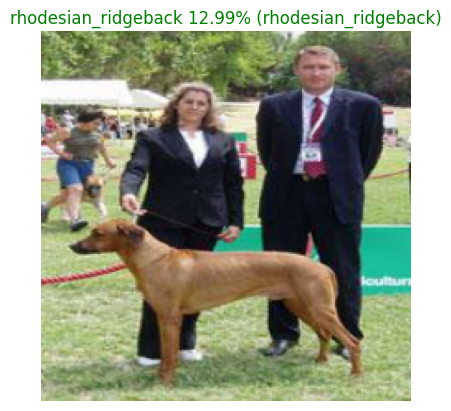

In [115]:
plot_pred(199)

In [116]:
get_y_val(1)

'bedlington_terrier'

In [117]:
val_label[1]


array([False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [118]:
!ls ..

app.py	logs   notebooks	      raw
input	model  prepare_dataset.ipynb  requirements.txt


In [121]:
def save_model(model,suffix=None):
    modeldir=os.path.join("../model",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    
    model_path=modeldir+"-"+suffix+".h5"
    print(f"saving to {model_path}")
    
    model.save(model_path)
    return model_path

model_path = save_model(model,"dog-breed-classification")

saving to ../model/20250512-19221747077723-dog-breed-classification.h5
